In [165]:
from sympy import *
import numpy as np

In [166]:
N=3
x = symbols(f"x:{N-1}",real=True)
y = symbols(f"y:{N-1}",real=True)
alpha = symbols(f"alpha:{N-1}",real=True)
alpha = (*alpha,1-sum(alpha))
P =[x[i]+I*y[i] for i in range(N-1)]
P += [1-sum(P)]
PP = [x[i]-I*y[i] for i in range(N-1)]
PP += [1-sum(PP)]
abl = lambda k : -1/alpha[k] * P[k] * PP[k] + sum([P[i]*PP[i] for i in range(N)])

In [167]:
Poly(abl(0),x+y)

Poly((2*alpha0 - 1)/alpha0*x0**2 + 2*x0*x1 - 2*x0 + 2*x1**2 - 2*x1 + (2*alpha0 - 1)/alpha0*y0**2 + 2*y0*y1 + 2*y1**2 + 1, x0, x1, y0, y1, domain='ZZ(alpha0)')

In [168]:
im_abl= lambda k : abl(k).subs(zip(x,[0]*(N-1)))-1
Poly(im_abl(0),y)

Poly((2*alpha0 - 1)/alpha0*y0**2 + 2*y0*y1 + 2*y1**2, y0, y1, domain='ZZ(alpha0)')

In [169]:
parabola=lambda k:Poly(abl(k).subs(zip(y,[0]*(N-1)))-1,x[k])
parabola(0)

Poly((2*alpha0 - 1)/alpha0*x0**2 + (2*x1 - 2)*x0 + 2*x1**2 - 2*x1, x0, domain='ZZ(x1,alpha0)')

In [170]:
def poly_to_parabola(poly):
    gen=poly.gens[0]
    d=poly.coeff_monomial(gen**2)
    e=-poly.coeff_monomial(gen)/(2*d)
    f=poly.coeff_monomial(1)-d*e**2
    par=d*(gen-e)**2
    return d,e,f,par

In [171]:
par=poly_to_parabola(parabola(0))[-1]
par

(2*alpha0 - 1)*(-alpha0*(2 - 2*x1)/(2*(2*alpha0 - 1)) + x0)**2/alpha0

In [172]:
Remainder = Poly(abl(0)-par-im_abl(0),x[1])
poly_to_parabola(Remainder)[-1]

(3*alpha0 - 2)*(x1 + (2 - 2*alpha0)/(2*(3*alpha0 - 2)))**2/(2*alpha0 - 1)

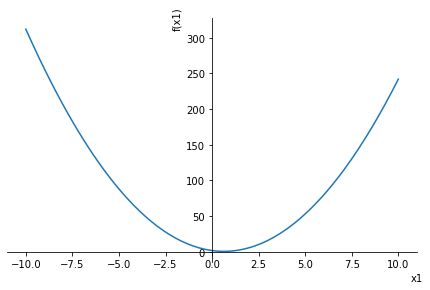

In [173]:
plot(simplify(Remainder.subs(alpha[0],0.3)))

In [158]:
expand(par+im_abl+Remainder-abl(0))

TypeError: unsupported operand type(s) for +: 'Mul' and 'function'

We make the assumption that im_abl is positive. That means that 0 will be the value that will increase the range of x. This assumption holds for alpha over 1 half

In [160]:
simplified = Eq(par,expand(-Remainder))
simplified

AttributeError: 'Poly' object has no attribute 'expand'

In [161]:
lmbda = symbols(f"lambda:{2}")
im=symbols("Im")
Lagrangian = x[0] - lmbda*(par+Remainder)
gradient = [Lagrangian.diff(var) for var in x+lmbda]
for el in gradient:
    display(expand(el))
result = solve(gradient,x+(lmbda,))
print("The result is:")
for r1,r2,var in zip(result[0],result[1],x+(lmbda,)):
    display(var)
    display(r1)
    display(r2)

TypeError: can't multiply sequence by non-int of type 'Poly'

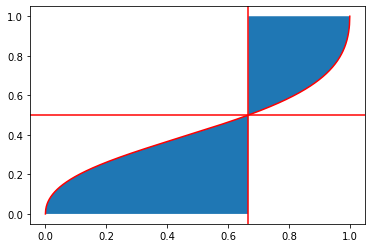

In [162]:
import numpy as np
import matplotlib.pyplot as plt
boundA=lambdify(alpha[0],result[0][0].subs(im,0))
boundB=lambdify(alpha[0],result[1][0].subs(im,0))
x_range=np.linspace(0,1-1e-10,1001)
A=np.clip(boundA(x_range),0,1)
B=np.clip(boundB(x_range),0,1)
plt.fill_between(x_range,A,B)
plt.plot(x_range,B,color="red")
plt.axhline(0.5,color="red")
plt.axvline((N-1)/(N),color="red")

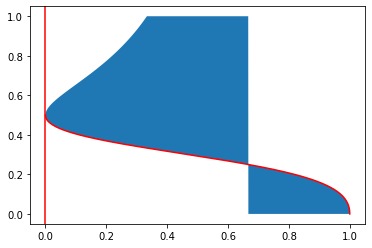

In [163]:
boundA=lambdify(alpha[0],result[0][1].subs(im,0.0))
boundB=lambdify(alpha[0],result[1][1].subs(im,0.0))
x_range=np.linspace(0,1-1e-10,2000)
A=np.clip(boundA(x_range),0,1)
B=np.clip(boundB(x_range),0,1)
plt.fill_between(x_range,A,B)
plt.plot(x_range,B,color="red")
# plt.axhline(0.5,color="red")
plt.axvline(0,color="red")

In [33]:
B[0]

0.5

In [57]:
import plotly.express as px
import pandas as pd
par_fun = lambdify([x[0],x[1],alpha[0]],par)
epsilon = 1e-3
x0 = np.linspace(0+epsilon,1-epsilon,101)
x1 = np.linspace(epsilon,1-epsilon,100)
alpha0 = np.arange(np.round((N-1)/N+epsilon,2),1-epsilon,0.1)
mesh = np.meshgrid(x0,x1,alpha0)
mesh=np.array([*mesh]).reshape(3,-1).T
par_eval=par_fun(mesh[:,0],mesh[:,1],mesh[:,2])
df = pd.DataFrame(mesh, columns = ['x0','x1','alpha0'])
df['par']=par_eval
fig = px.line(df, x="x0", y="par",animation_frame='x1',color='alpha0')
fig.show()

In [56]:
Rem_fun = lambdify([alpha[0],x[1]],-simplify(Remainder))
print(Rem_fun(0.1,0.1))
Rem_eval= Rem_fun(mesh[:,2],mesh[:,1])
df['remainder']=Rem_eval
fig=px.line(df, x="x0", y=["remainder",'par'],animation_frame='x1',color='alpha0',range_y=[0,1])
fig.update_xaxes(nticks=20)
fig.show()

-0.9212499999999999


In [59]:
x_range[870]
B[870]

0.6465493802010177